# Your First AI application

Going forward, AI algorithms will be incorporated into more and more everyday applications. For example, you might want to include an image classifier in a smart phone app. To do this, you'd use a deep learning model trained on hundreds of thousands of images as part of the overall application architecture. A large part of software development in the future will be using these types of models as common parts of applications.

In this project, you'll train an image classifier to recognize different species of flowers. You can imagine using something like this in a phone app that tells you the name of the flower your camera is looking at. In practice you'd train this classifier, then export it for use in your application. We'll be using [this dataset](http://www.robots.ox.ac.uk/~vgg/data/flowers/102/index.html) from Oxford of 102 flower categories, you can see a few examples below.

<img src='assets/Flowers.png' width=500px>

The project is broken down into multiple steps:

* Load the image dataset and create a pipeline.
* Build and Train an image classifier on this dataset.
* Use your trained model to perform inference on flower images.

We'll lead you through each part which you'll implement in Python.

When you've completed this project, you'll have an application that can be trained on any set of labeled images. Here your network will be learning about flowers and end up as a command line application. But, what you do with your new skills depends on your imagination and effort in building a dataset. For example, imagine an app where you take a picture of a car, it tells you what the make and model is, then looks up information about it. Go build your own dataset and make something new.

## Install Datasets and Upgrade TensorFlow

To ensure we can download the latest version of the `oxford_flowers102` dataset, let's first install both `tensorflow-datasets` and `tfds-nightly`.
* `tensorflow-datasets` is the stable version that is released on a cadence of every few months
* `tfds-nightly` is released every day and has the latest version of the datasets

We'll also upgrade TensorFlow to ensure we have a version that is compatible with the latest version of the dataset.

In [1]:
import os
os.environ['PATH'] = f"{os.environ['PATH']}:/root/.local/bin"

!rm -rf /root/tensorflow_datasets/

In [2]:
%pip --no-cache-dir install tensorflow-datasets --user
%pip --no-cache-dir install tfds-nightly --user
%pip --no-cache-dir install --upgrade tensorflow --user

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.6/113.6 kB 271.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 310.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 132.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 345.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 343.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 353.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 334.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.15.1 requires tensorflow<2.16,>=2.15, but you have tensorflow 2.16.1 which is incompatible.


After the above installations have finished **be sure to restart the kernel**. You can do this by going to **Kernel > Restart**.

In [3]:
# Import TensorFlow
import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_hub as hub

# Ignore some warnings that are not relevant (you can remove this if you prefer)
import warnings
warnings.filterwarnings('ignore')

In [4]:
# Make all necessary imports.
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json

from PIL import Image

import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_hub as hub

from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [5]:
# Some other recommended settings:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
tfds.disable_progress_bar()

## Load the Dataset

Here you'll use `tensorflow_datasets` to load the [Oxford Flowers 102 dataset](https://www.tensorflow.org/datasets/catalog/oxford_flowers102). This dataset has 3 splits: `'train'`, `'test'`, and `'validation'`.  You'll also need to make sure the training data is normalized and resized to 224x224 pixels as required by the pre-trained networks.

The validation and testing sets are used to measure the model's performance on data it hasn't seen yet, but you'll still need to normalize and resize the images to the appropriate size.

In [6]:
import tensorflow_datasets as tfds

# TODO: Load the dataset with TensorFlow Datasets.
dataset, dataset_info = tfds.load('oxford_flowers102', as_supervised=True, with_info=True)

# TODO: Create a training set, a validation set and a test set.

training_set = dataset['train']
validation_set = dataset['validation']
test_set = dataset['test']

# Display dataset information to verify correct loading
print(f"Dataset info: {dataset_info}")
print(f"Training set size: {len(training_set)}")
print(f"Validation set size: {len(validation_set)}")
print(f"Test set size: {len(test_set)}")



Dataset oxford_flowers102 downloaded and prepared to /root/tensorflow_datasets/oxford_flowers102/2.1.1. Subsequent calls will reuse this data.
Dataset info: tfds.core.DatasetInfo(
    name='oxford_flowers102',
    full_name='oxford_flowers102/2.1.1',
    description="""
    The Oxford Flowers 102 dataset is a consistent of 102 flower categories commonly
    occurring in the United Kingdom. Each class consists of between 40 and 258
    images. The images have large scale, pose and light variations. In addition,
    there are categories that have large variations within the category and several
    very similar categories.
    
    The dataset is divided into a training set, a validation set and a test set. The
    training set and validation set each consist of 10 images per class (totalling
    1020 images each). The test set consists of the remaining 6149 images (minimum
    20 per class).
    
    Note: The dataset by default comes with a test size larger than the train size.
    For

## Explore the Dataset

In [7]:
# Get the number of examples in each set from the dataset info.
num_training_examples = dataset_info.splits['train'].num_examples
num_validation_examples = dataset_info.splits['validation'].num_examples
num_test_examples = dataset_info.splits['test'].num_examples

print("Number of examples in training set: {}".format(num_training_examples))
print("Number of examples in validation set: {}".format(num_validation_examples))
print("Number of examples in test set: {}".format(num_test_examples))

# Get the number of classes in the dataset from the dataset info.
num_classes = dataset_info.features['label'].num_classes


print("Number of classes in the dataset: {}".format(num_classes))

Number of examples in training set: 1020
Number of examples in validation set: 1020
Number of examples in test set: 6149
Number of classes in the dataset: 102


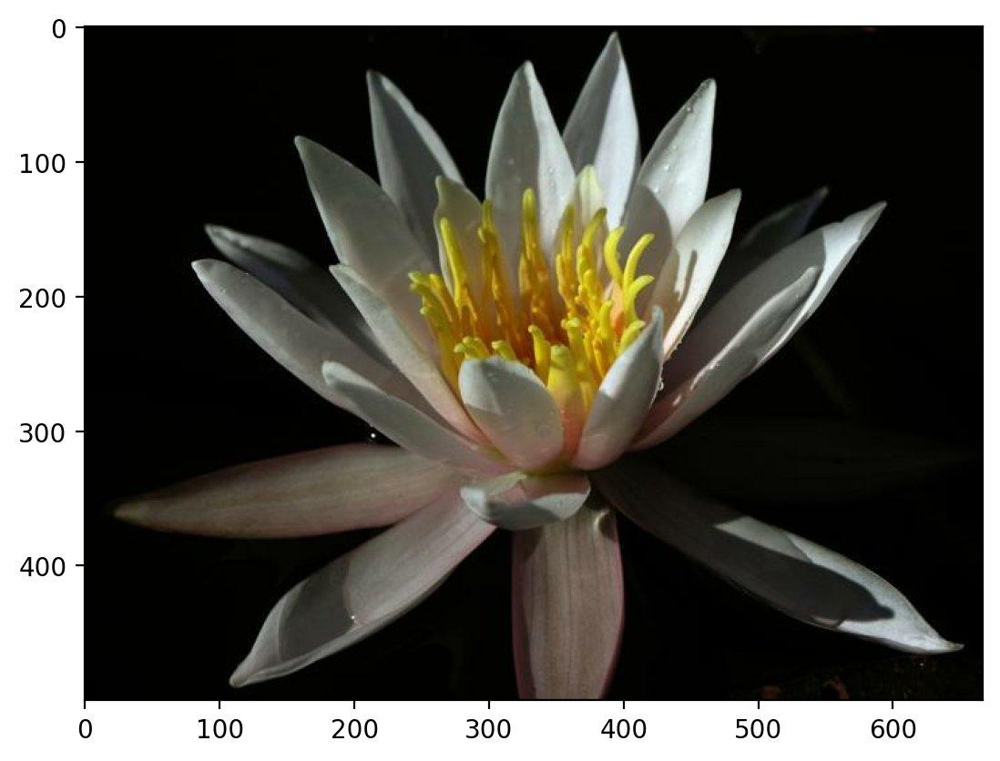

The shape of this image is: (500, 667, 3)
The label of this image is: 72


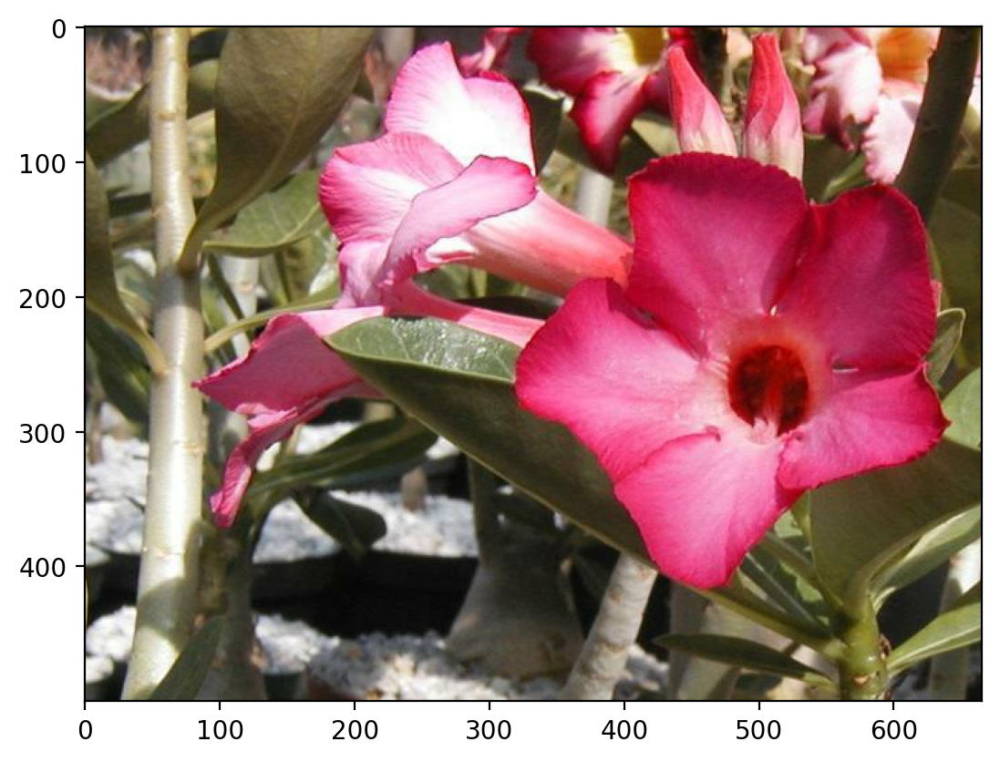

The shape of this image is: (500, 666, 3)
The label of this image is: 84


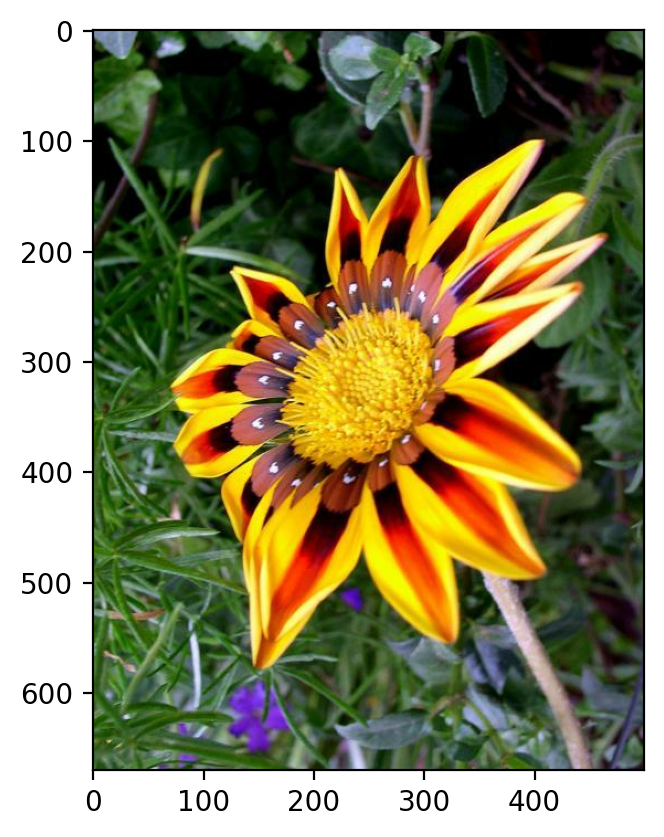

The shape of this image is: (670, 500, 3)
The label of this image is: 70


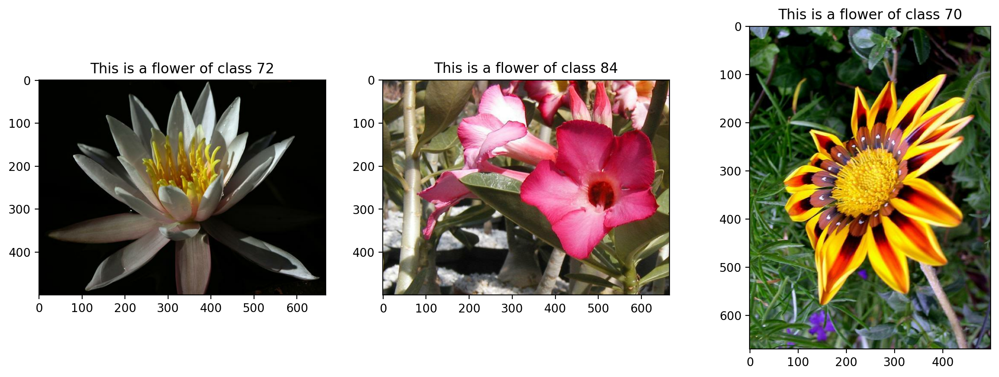

In [8]:
"""
1. Print the shape and corresponding label of 3 images in the training set.
2. Plot 3 images from the training set and set the title to a descriptive text based on the flower label.
"""

# Print the shape and corresponding label of 3 images in the training set.
flower_labels = ['Rose', 'Sunflower', 'Daisy', 'Tulip', 'Lily']

for image, label in training_set.take(3):
    image = image.numpy()
    label = label.numpy()

    plt.imshow(image)
    plt.show()

    print('The shape of this image is:', image.shape)

    if 0 <= label < len(flower_labels):
        print('The label of this image is:', flower_labels[int(label)])
    else:
        print('The label of this image is:', label)

# Plot 3 images from the training set and set the title to a descriptive text based on the flower label.
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for i, (image, label) in enumerate(training_set.take(3)):
    image = image.numpy()
    label = label.numpy()

    if 0 <= label < len(flower_labels):
        title = f"This is a {flower_labels[int(label)]} flower"
    else:
        title = f"This is a flower of class {label}"

    axes[i].imshow(image)
    axes[i].set_title(title)

plt.show()

### Label Mapping

You'll also need to load in a mapping from label to category name. You can find this in the file `label_map.json`. It's a JSON object which you can read in with the [`json` module](https://docs.python.org/3.7/library/json.html). This will give you a dictionary mapping the integer coded labels to the actual names of the flowers.

In [43]:
import json
from google.colab import files
uploaded = files.upload()



Saving predict.py to predict (1).py
Saving orange_dahlia.jpg to orange_dahlia (2).jpg
Saving hard-leaved_pocket_orchid (1).jpg to hard-leaved_pocket_orchid (1) (2).jpg
Saving hard-leaved_pocket_orchid.jpg to hard-leaved_pocket_orchid (3).jpg
Saving cautleya_spicata.jpg to cautleya_spicata (2).jpg
Saving wild_pansy.jpg to wild_pansy (2).jpg
Saving label_map.json to label_map (2).json


In [10]:

# Open the label_map.json file in read mode
with open('label_map.json', 'r') as f:
    # Load the contents of the file using json.load()
    class_names = json.load(f)

# Print the contents of the label_map.json file
print(class_names)


{'21': 'fire lily', '3': 'canterbury bells', '45': 'bolero deep blue', '1': 'pink primrose', '34': 'mexican aster', '27': 'prince of wales feathers', '7': 'moon orchid', '16': 'globe-flower', '25': 'grape hyacinth', '26': 'corn poppy', '79': 'toad lily', '39': 'siam tulip', '24': 'red ginger', '67': 'spring crocus', '35': 'alpine sea holly', '32': 'garden phlox', '10': 'globe thistle', '6': 'tiger lily', '93': 'ball moss', '33': 'love in the mist', '9': 'monkshood', '102': 'blackberry lily', '14': 'spear thistle', '19': 'balloon flower', '100': 'blanket flower', '13': 'king protea', '49': 'oxeye daisy', '15': 'yellow iris', '61': 'cautleya spicata', '31': 'carnation', '64': 'silverbush', '68': 'bearded iris', '63': 'black-eyed susan', '69': 'windflower', '62': 'japanese anemone', '20': 'giant white arum lily', '38': 'great masterwort', '4': 'sweet pea', '86': 'tree mallow', '101': 'trumpet creeper', '42': 'daffodil', '22': 'pincushion flower', '2': 'hard-leaved pocket orchid', '54': 's

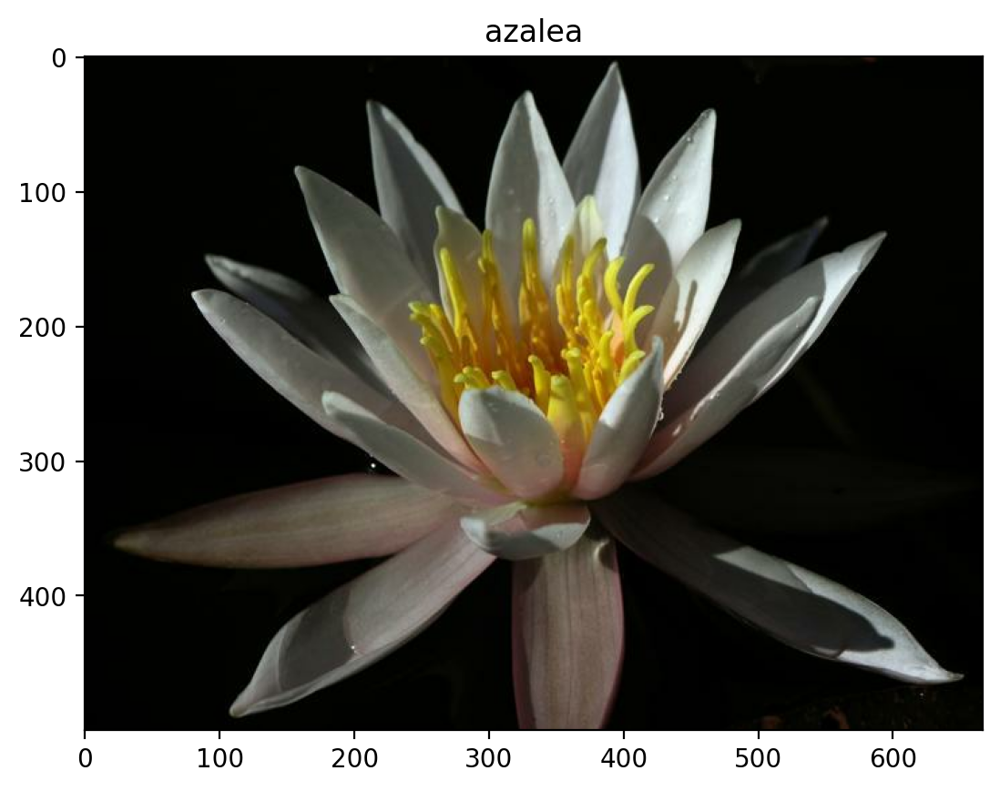

In [11]:
# Plot 1 image from the training set. Set the title
# of the plot to the corresponding class name.
for image, label in training_set.take(1):
    image = image.numpy()
    label = label.numpy()

plt.imshow(image)
plt.title(class_names[str(label)])
plt.show()



## Create Pipeline

In [12]:
# Create a pipeline for each set.
batch_size = 64
image_size = 224

def format_image(image, label):
    # Check if the input image is a TensorFlow tensor
    if not isinstance(image, tf.Tensor):
        raise TypeError("Input image must be a TensorFlow tensor.")

    # Get the shape of the input image
    input_shape = tf.shape(image)

    # Check if the input image has the correct rank
    if input_shape.shape[0] != 3:
        raise ValueError("Input image must have rank 3.")

    # Get the height, width, and number of channels dynamically
    height = input_shape[0]
    width = input_shape[1]
    channels = input_shape[2]

    # Cast image to float32
    image = tf.cast(image, tf.float32)

    # Resize image to desired size
    image = tf.image.resize(image, (224, 224))

    # Normalize image values to range [0, 1]
    image /= 255.0

    return image, label

training_batches = training_set.shuffle(num_training_examples // 4).map(format_image).batch(batch_size).prefetch(1)
testing_batches = test_set.map(format_image).batch(batch_size).prefetch(1)
validation_batches = validation_set.map(format_image).batch(batch_size).prefetch(1)



# Build and Train the Classifier

Now that the data is ready, it's time to build and train the classifier. You should use the MobileNet pre-trained model from TensorFlow Hub to get the image features. Build and train a new feed-forward classifier using those features.

We're going to leave this part up to you. If you want to talk through it with someone, chat with your fellow students!

Refer to the rubric for guidance on successfully completing this section. Things you'll need to do:

* Load the MobileNet pre-trained network from TensorFlow Hub.
* Define a new, untrained feed-forward network as a classifier.
* Train the classifier.
* Plot the loss and accuracy values achieved during training for the training and validation set.
* Save your trained model as a Keras model.

We've left a cell open for you below, but use as many as you need. Our advice is to break the problem up into smaller parts you can run separately. Check that each part is doing what you expect, then move on to the next. You'll likely find that as you work through each part, you'll need to go back and modify your previous code. This is totally normal!

When training make sure you're updating only the weights of the feed-forward network. You should be able to get the validation accuracy above 70% if you build everything right.

**Note for Workspace users:** One important tip if you're using the workspace to run your code: To avoid having your workspace disconnect during the long-running tasks in this notebook, please read in the earlier page in this lesson called Intro to GPU Workspaces about Keeping Your Session Active. You'll want to include code from the workspace_utils.py module. Also, If your model is over 1 GB when saved as a checkpoint, there might be issues with saving backups in your workspace. If your saved checkpoint is larger than 1 GB (you can open a terminal and check with `ls -lh`), you should reduce the size of your hidden layers and train again.

In [13]:
# Build and train your network.
URL = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4"

feature_extractor = hub.KerasLayer(URL, input_shape = (image_size, image_size, 3))

feature_extractor.trainable = False
model = tf.keras.Sequential([
        feature_extractor,
        tf.keras.layers.Dense(num_classes, activation = 'softmax')
])

model.summary()
print('Is there a GPU Available:', tf.test.is_gpu_available())

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

EPOCHS = 10

history = model.fit(training_batches,
                    epochs = EPOCHS,
                    validation_data = validation_batches)



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 102)               130662    
                                                                 
Total params: 2388646 (9.11 MB)
Trainable params: 130662 (510.40 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


Is there a GPU Available: True
Epoch 1/10
16/16 [==============================] - 8s 141ms/step - loss: 4.5295 - accuracy: 0.0520 - val_loss: 3.6629 - val_accuracy: 0.2118
Epoch 2/10
16/16 [==============================] - 2s 95ms/step - loss: 2.8337 - accuracy: 0.5324 - val_loss: 2.6429 - val_accuracy: 0.5343
Epoch 3/10
16/16 [==============================] - 2s 96ms/step - loss: 1.7819 - accuracy: 0.8176 - val_loss: 2.0256 - val_accuracy: 0.6745
Epoch 4/10
16/16 [==============================] - 2s 95ms/step - loss: 1.1570 - accuracy: 0.9118 - val_loss: 1.6656 - val_accuracy: 0.7284
Epoch 5/10
16/16 [==============================] - 2s 96ms/step - loss: 0.8050 - accuracy: 0.9510 - val_loss: 1.4419 - val_accuracy: 0.7598
Epoch 6/10
16/16 [==============================] - 2s 96ms/step - loss: 0.5896 - accuracy: 0.9784 - val_loss: 1.3034 - val_accuracy: 0.7667
Epoch 7/10
16/16 [==============================] - 2s 96ms/step - loss: 0.4513 - accuracy: 0.9892 - val_loss: 1.2036 - va

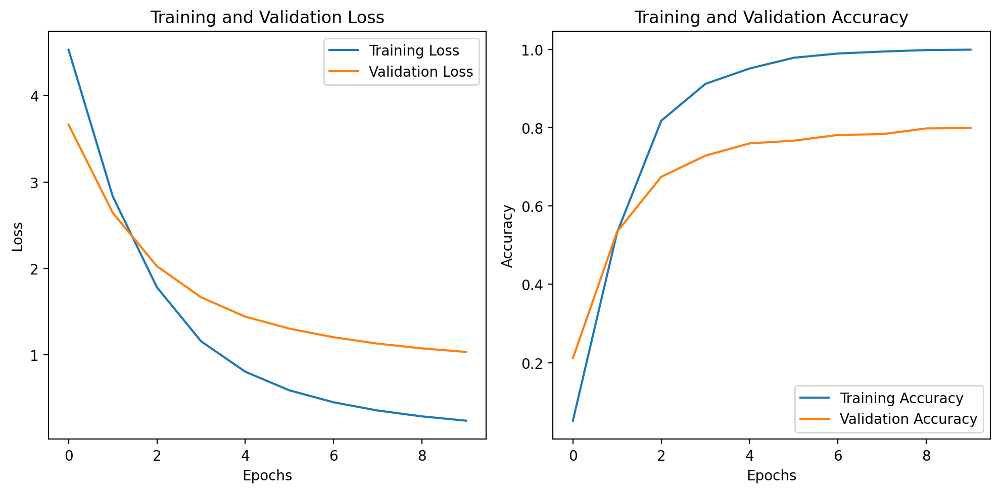

In [14]:
# TODO: Plot the loss and accuracy values achieved during training for the training and validation set.

# Retrieve training and validation loss
training_loss = history.history['loss']
validation_loss = history.history['val_loss']

# Retrieve training and validation accuracy
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(training_accuracy, label='Training Accuracy')
plt.plot(validation_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()


## Testing your Network

It's good practice to test your trained network on test data, images the network has never seen either in training or validation. This will give you a good estimate for the model's performance on completely new images. You should be able to reach around 70% accuracy on the test set if the model has been trained well.

In [15]:
# TODO: Print the loss and accuracy values achieved on the entire test set.

test_loss, test_accuracy = model.evaluate(testing_batches)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)



97/97 [==============================] - 4s 44ms/step - loss: 1.1405 - accuracy: 0.7569
Test Loss: 1.1404671669006348
Test Accuracy: 0.7568710446357727


## Save the Model

Now that your network is trained, save the model so you can load it later for making inference. In the cell below save your model as a Keras model (*i.e.* save it as an HDF5 file).

In [16]:
# TODO: Save your trained model as a Keras model.
saved_keras_model_filepath = 'my_flowers_classifier_model.h5'

# Save the trained model
model.save(saved_keras_model_filepath)

print("Model saved successfully as", saved_keras_model_filepath)




Model saved successfully as my_flowers_classifier_model.h5


## Load the Keras Model

Load the Keras model you saved above.

In [17]:
# TODO: Load the Keras model
# Load the saved model
loaded_keras_model = tf.keras.models.load_model(saved_keras_model_filepath, custom_objects={'KerasLayer': hub.KerasLayer})

# Display the summary of the loaded model
loaded_keras_model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 102)               130662    
                                                                 
Total params: 2388646 (9.11 MB)
Trainable params: 130662 (510.40 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


# Inference for Classification

Now you'll write a function that uses your trained network for inference. Write a function called `predict` that takes an image, a model, and then returns the top $K$ most likely class labels along with the probabilities. The function call should look like:

```python
probs, classes = predict(image_path, model, top_k)
```

If `top_k=5` the output of the `predict` function should be something like this:

```python
probs, classes = predict(image_path, model, 5)
print(probs)
print(classes)
> [ 0.01558163  0.01541934  0.01452626  0.01443549  0.01407339]
> ['70', '3', '45', '62', '55']
```

Your `predict` function should use `PIL` to load the image from the given `image_path`. You can use the [Image.open](https://pillow.readthedocs.io/en/latest/reference/Image.html#PIL.Image.open) function to load the images. The `Image.open()` function returns an `Image` object. You can convert this `Image` object to a NumPy array by using the `np.asarray()` function.

The `predict` function will also need to handle pre-processing the input image such that it can be used by your model. We recommend you write a separate function called `process_image` that performs the pre-processing. You can then call the `process_image` function from the `predict` function.

### Image Pre-processing

The `process_image` function should take in an image (in the form of a NumPy array) and return an image in the form of a NumPy array with shape `(224, 224, 3)`.

First, you should convert your image into a TensorFlow Tensor and then resize it to the appropriate size using `tf.image.resize`.

Second, the pixel values of the input images are typically encoded as integers in the range 0-255, but the model expects the pixel values to be floats in the range 0-1. Therefore, you'll also need to normalize the pixel values.

Finally, convert your image back to a NumPy array using the `.numpy()` method.

In [18]:
# TODO: Create the process_image function
# Create the process_image function
def process_image(image):
    # Convert the image to a TensorFlow Tensor
    image = tf.convert_to_tensor(image)

    # Resize the image to the appropriate size (224x224)
    image = tf.image.resize(image, (224, 224))

    # Normalize the pixel values to the range [0, 1]
    image = image / 255.0

    # Convert the image back to a NumPy array
    image = image.numpy()

    return image




To check your `process_image` function we have provided 4 images in the `./test_images/` folder:

* cautleya_spicata.jpg
* hard-leaved_pocket_orchid.jpg
* orange_dahlia.jpg
* wild_pansy.jpg

The code below loads one of the above images using `PIL` and plots the original image alongside the image produced by your `process_image` function. If your `process_image` function works, the plotted image should be the correct size.

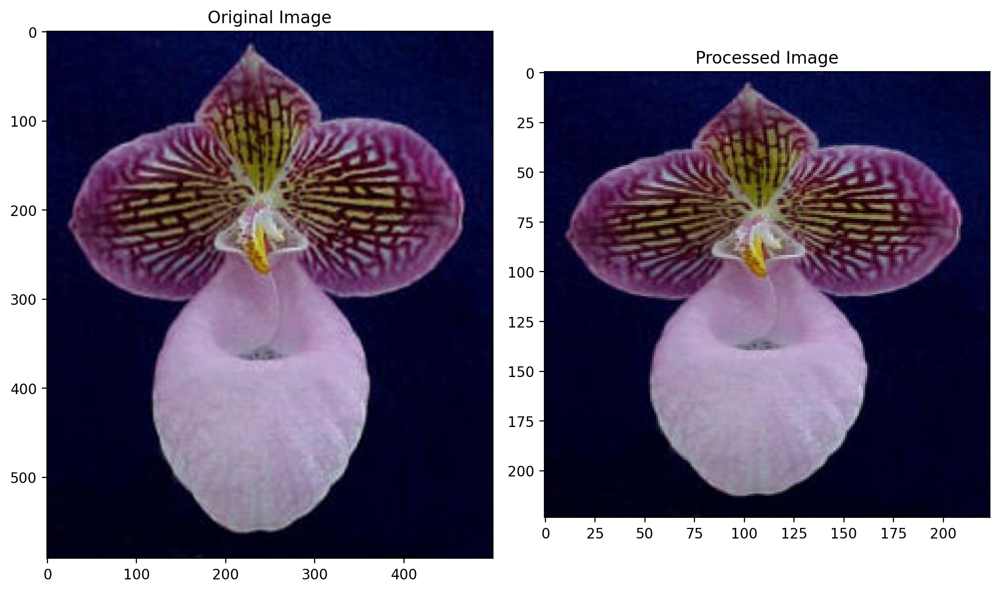

In [19]:
from PIL import Image



image_path = 'hard-leaved_pocket_orchid.jpg'
im = Image.open(image_path)
test_image = np.asarray(im)

processed_test_image = process_image(test_image)

fig, (ax1, ax2) = plt.subplots(figsize=(10,10), ncols=2)
ax1.imshow(test_image)
ax1.set_title('Original Image')
ax2.imshow(processed_test_image)
ax2.set_title('Processed Image')
plt.tight_layout()
plt.show()


Once you can get images in the correct format, it's time to write the `predict` function for making inference with your model.

### Inference

Remember, the `predict` function should take an image, a model, and then returns the top $K$ most likely class labels along with the probabilities. The function call should look like:

```python
probs, classes = predict(image_path, model, top_k)
```

If `top_k=5` the output of the `predict` function should be something like this:

```python
probs, classes = predict(image_path, model, 5)
print(probs)
print(classes)
> [ 0.01558163  0.01541934  0.01452626  0.01443549  0.01407339]
> ['70', '3', '45', '62', '55']
```

Your `predict` function should use `PIL` to load the image from the given `image_path`. You can use the [Image.open](https://pillow.readthedocs.io/en/latest/reference/Image.html#PIL.Image.open) function to load the images. The `Image.open()` function returns an `Image` object. You can convert this `Image` object to a NumPy array by using the `np.asarray()` function.

**Note:** The image returned by the `process_image` function is a NumPy array with shape `(224, 224, 3)` but the model expects the input images to be of shape `(1, 224, 224, 3)`. This extra dimension represents the batch size. We suggest you use the `np.expand_dims()` function to add the extra dimension.

In [40]:
# TODO: Create the predict function

# Create the predict function
def predict(image_path, model, top_k = 5):
    image = Image.open(image_path)
    image = process_image(image)
    image = np.expand_dims(image, axis = 0)

    ps = model.predict(image)

    values, indices = tf.math.top_k(ps, top_k)

    return values.numpy()[0], indices.numpy()[0]


In [41]:
probs, classes = predict( 'orange_dahlia.jpg', model, 5)
print(probs)
print(classes)


1/1 [==============================] - 0s 25ms/step
[0.28377596 0.19064394 0.10194968 0.04523614 0.04505441]
[58  4 65 99 40]


# Sanity Check

It's always good to check the predictions made by your model to make sure they are correct. To check your predictions we have provided 4 images in the `./test_images/` folder:

* cautleya_spicata.jpg
* hard-leaved_pocket_orchid.jpg
* orange_dahlia.jpg
* wild_pansy.jpg

In the cell below use `matplotlib` to plot the input image alongside the probabilities for the top 5 classes predicted by your model. Plot the probabilities as a bar graph. The plot should look like this:

<img src='assets/inference_example.png' width=600px>

You can convert from the class integer labels to actual flower names using `class_names`.

1/1 [==============================] - 0s 24ms/step


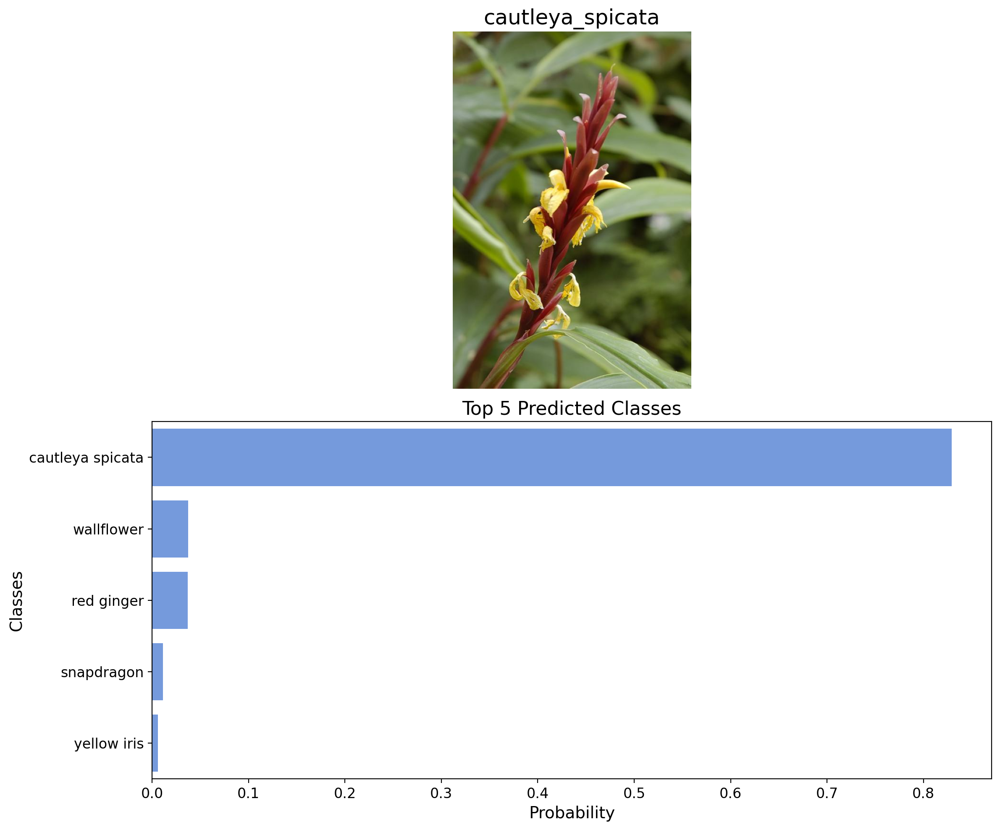

1/1 [==============================] - 0s 24ms/step


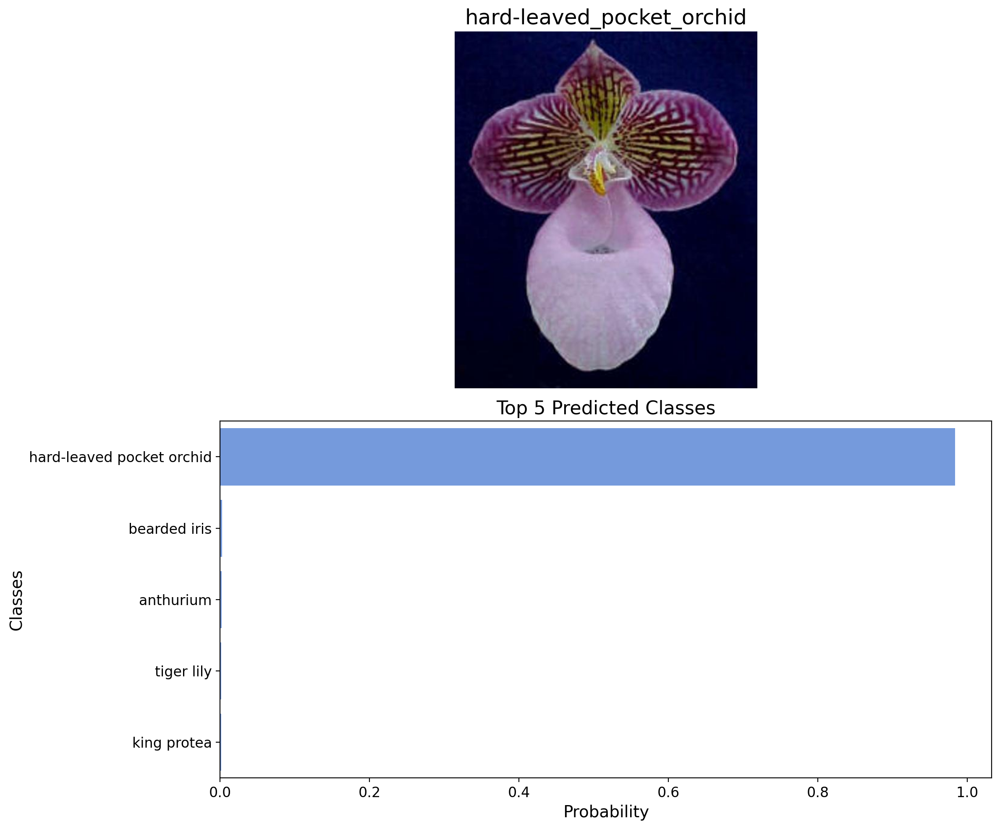

1/1 [==============================] - 0s 23ms/step


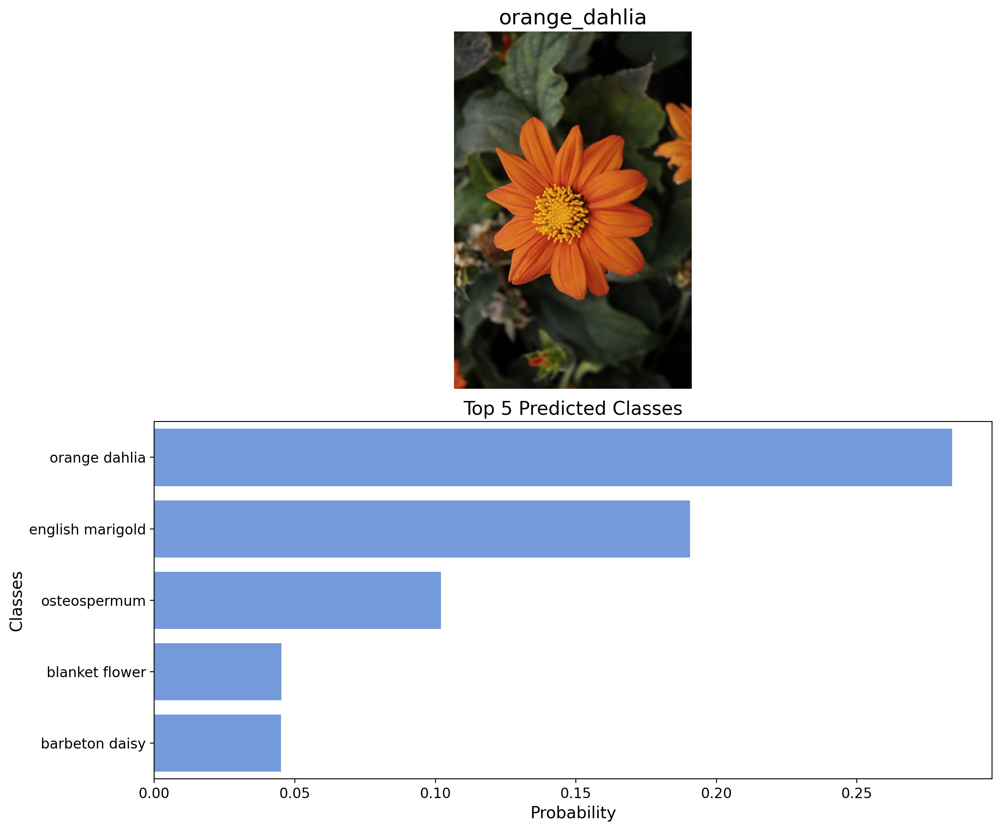

1/1 [==============================] - 0s 24ms/step


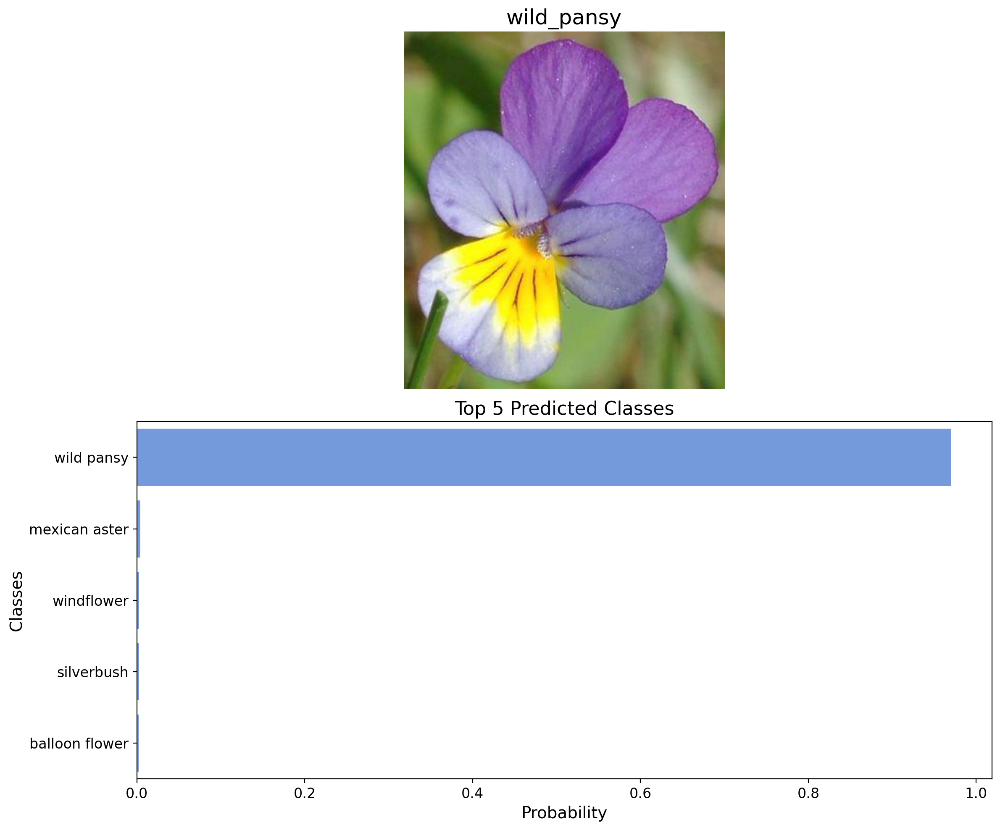

In [42]:


# Plot the input image along with the top 5 classes
images = ['cautleya_spicata.jpg', 'hard-leaved_pocket_orchid.jpg', 'orange_dahlia.jpg', 'wild_pansy.jpg']

for image_name in images:
    image_path = image_name

    image = Image.open(image_path)

    predict_probs, predict_classes = predict(image_path, model)

    classes = []
    for predict_class in predict_classes:
        classes.append(class_names[str(predict_class + 1)])

    plt.figure(figsize=(12, 10))

    # Plotting Image
    plt.subplot(2, 1, 1)
    plt.imshow(image)
    plt.title(image_name[:-4], fontsize=18)
    plt.axis('off')

    # Plotting probabilities
    plt.subplot(2, 1, 2)
    sns.barplot(x=predict_probs, y=classes, color='cornflowerblue')
    plt.xlabel('Probability', fontsize=14)
    plt.ylabel('Classes', fontsize=14)
    plt.title('Top 5 Predicted Classes', fontsize=16)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    plt.tight_layout()
    plt.show()

